In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import glob
import tensorflow as tf
import matplotlib.pyplot as plt
from keras.models import load_model
from keras.preprocessing import image
import seaborn as sns
from sklearn import metrics

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [11]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/valid.csv
/kaggle/input/train.csv
/kaggle/input/test.csv
/kaggle/input/real_vs_fake/real-vs-fake/valid/fake/W3DVWMWYOI.jpg
/kaggle/input/real_vs_fake/real-vs-fake/valid/fake/IQEOWSOAID.jpg
/kaggle/input/real_vs_fake/real-vs-fake/valid/fake/8JL4TYOH6D.jpg
/kaggle/input/real_vs_fake/real-vs-fake/valid/fake/69FFH5KFY8.jpg
/kaggle/input/real_vs_fake/real-vs-fake/valid/fake/ZZAA0631IK.jpg
/kaggle/input/real_vs_fake/real-vs-fake/valid/fake/BDY8YAWSIS.jpg
/kaggle/input/real_vs_fake/real-vs-fake/valid/fake/XKHWRIM64I.jpg
/kaggle/input/real_vs_fake/real-vs-fake/valid/fake/S579BG249Z.jpg
/kaggle/input/real_vs_fake/real-vs-fake/valid/fake/BLIFEE55NI.jpg
/kaggle/input/real_vs_fake/real-vs-fake/valid/fake/IC315PLQBW.jpg
/kaggle/input/real_vs_fake/real-vs-fake/valid/fake/2UD6KNMAD3.jpg
/kaggle/input/real_vs_fake/real-vs-fake/valid/fake/LSQ9KCS7ON.jpg
/kaggle/input/real_vs_fake/real-vs-fake/valid/fake/MKIE6V0QY6.jpg
/kaggle/input/real_vs_fake/real-vs-fake/valid/fake/XC79KP4XXQ.jpg
/kagg

# Data Loading

The paths to the training, validation, and test sets have been specified below.

In [2]:
main_path = '/kaggle/input/real_vs_fake/real-vs-fake'

train_dir = os.path.join(main_path, 'train')
valid_dir = os.path.join(main_path, 'valid')
test_dir = os.path.join(main_path, 'test')

As we can see, each directory contains two subfolders: fake and real.

In [3]:
print("Train_dir Subfolders: ", os.listdir(train_dir))
print("Valid_dir Subfolders: ", os.listdir(valid_dir))
print("Test_dir Subfolders: ", os.listdir(test_dir))

Train_dir Subfolders:  ['fake', 'real']
Valid_dir Subfolders:  ['fake', 'real']
Test_dir Subfolders:  ['fake', 'real']


# Short EDA - Exploratory Data Analysis

Create a dictionary with three keys:
* **folder**: train, validation and test folders
* **image_path**: path of the images
* **label**: image's label (fake or real)    

In [4]:
images_df = {
    "folder":[],
    "image_path":[],
    "label":[]
}

for folder in os.listdir(main_path): #iterate on each train, valid and test folder
    for label in os.listdir(main_path + "/" + folder): #iterate on fake and real folders (labels)
        for img in glob.glob(main_path + "/" + folder + "/" + label + "/*.jpg"):
            images_df["folder"].append(folder)
            images_df["image_path"].append(img)
            images_df["label"].append(label)

In [5]:
images_df = pd.DataFrame(images_df)

In [6]:
images_df.head()

,folder,image_path,label
0,valid,/kaggle/input/real_vs_fake/real-vs-fake/valid/...,fake
1,valid,/kaggle/input/real_vs_fake/real-vs-fake/valid/...,fake
2,valid,/kaggle/input/real_vs_fake/real-vs-fake/valid/...,fake
3,valid,/kaggle/input/real_vs_fake/real-vs-fake/valid/...,fake
4,valid,/kaggle/input/real_vs_fake/real-vs-fake/valid/...,fake


### Labels distribution

In [7]:
real_grouped_df = images_df[images_df['label'] == "real"].groupby('folder')
fake_grouped_df = images_df[images_df['label'] == "fake"].groupby('folder')

In [8]:
real_grouped_df.size()

folder
test     10000
train    50000
valid    10000
dtype: int64

In [9]:
fake_grouped_df.size()

folder
test     10000
train    50000
valid    10000
dtype: int64

As we can see fromt the results, the labels are equally distributed on each folder.

# Data Preparation for visualization and training

## Data Augmentation

ImageDataGenerator generates batches of tensor image data with real-time data augmentation. Horizontal flip data augmentation is set to True in order to increase the size of a dataset by flipping images horizontally. This can help improve the accuracy of the model by exposing it to additional variations of the same images.

In [10]:
image_train_gen = tf.keras.preprocessing.image.ImageDataGenerator(
                                  rescale=1./255.,
                                  horizontal_flip=True,
                                  )

image_gen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.)

Important! test_ds prediction and train_ds.classes (ground-truth) **will be not alligned** with suffle=True, so I need to disable shuffle for the test set.

In [11]:
train_ds = image_train_gen.flow_from_directory(
    train_dir,
    target_size=(256, 256),
    batch_size=64,
    class_mode='binary',
)

valid_ds = image_gen.flow_from_directory(
    valid_dir,
    target_size=(256, 256),
    batch_size=64,
    class_mode='binary'
)

test_ds = image_gen.flow_from_directory(
    test_dir,
    target_size=(256, 256),
    batch_size=64,
    class_mode='binary',
    shuffle=False) #shuffle disabled

Found 100000 images belonging to 2 classes.
Found 20000 images belonging to 2 classes.
Found 20000 images belonging to 2 classes.


In [12]:
def plot_images(img, label):
    plt.figure(figsize=[12, 12])
    for i in range(16):
        plt.subplot(4, 4, i+1)
        plt.imshow(img[i])
        plt.axis('off')
        if label[i] == 0:
            plt.title("Fake")
        else:
            plt.title("Real")

# Data Visualization

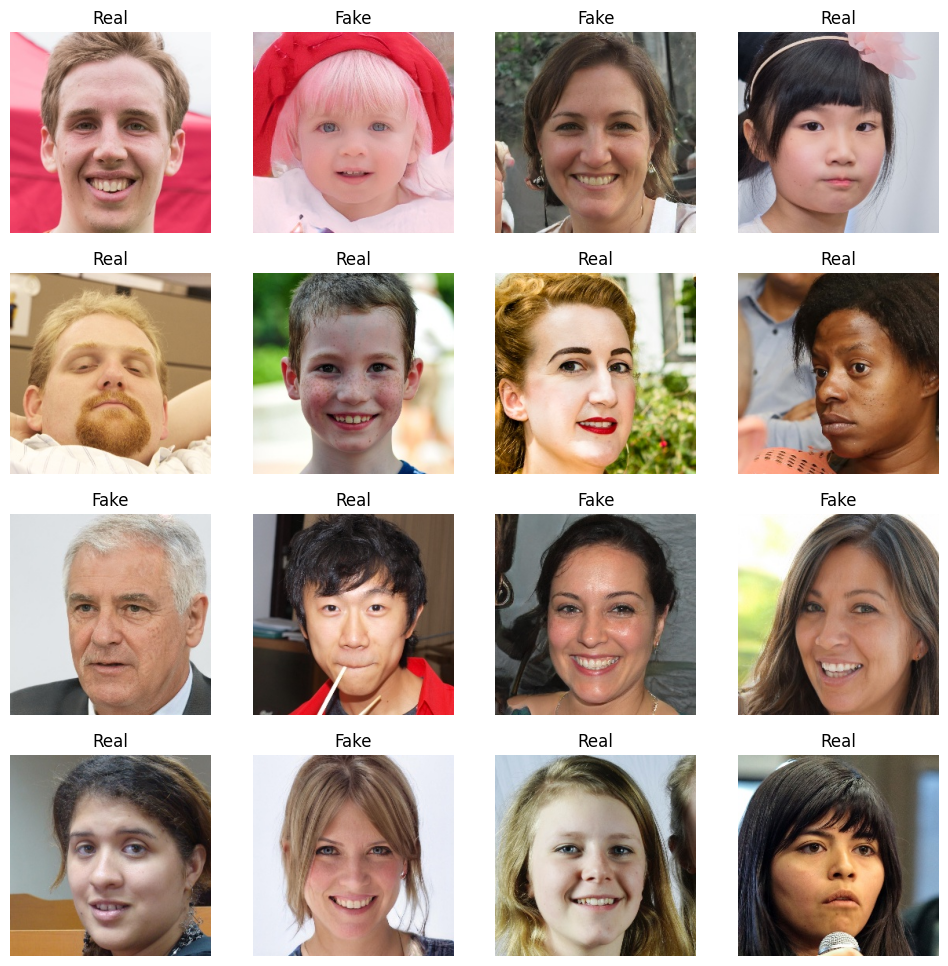

In [13]:
img,lbl = next(train_ds)
plot_images(img,lbl)


It's visible that all the value are scaled.

In [14]:
for img, label in train_ds:
    print("Values: ", img[0])
    print("Label: ", label[0])
    break

Values:  [[[0.3529412  0.16862746 0.09019608]
  [0.32156864 0.13725491 0.05882353]
  [0.30588236 0.12156864 0.04313726]
  ...
  [0.41960788 0.23137257 0.14117648]
  [0.42352945 0.24313727 0.14901961]
  [0.43137258 0.2509804  0.15686275]]

 [[0.3372549  0.15294118 0.07450981]
  [0.3254902  0.14117648 0.0627451 ]
  [0.31764707 0.13333334 0.05490196]
  ...
  [0.40784317 0.21960786 0.12941177]
  [0.40784317 0.227451   0.13333334]
  [0.41176474 0.23137257 0.13725491]]

 [[0.31764707 0.14117648 0.05882353]
  [0.3254902  0.14901961 0.06666667]
  [0.33333334 0.14901961 0.07058824]
  ...
  [0.4156863  0.227451   0.13725491]
  [0.4156863  0.227451   0.13725491]
  [0.4156863  0.227451   0.13725491]]

 ...

 [[0.6901961  0.23137257 0.26666668]
  [0.69411767 0.23529413 0.27058825]
  [0.7137255  0.2509804  0.29803923]
  ...
  [0.7019608  0.23137257 0.27058825]
  [0.69411767 0.22352943 0.25882354]
  [0.70980394 0.2392157  0.27450982]]

 [[0.69411767 0.22352943 0.25882354]
  [0.6862745  0.21568629 0.2

In [15]:
train_ds.class_indices

{'fake': 0, 'real': 1}

In [16]:
input_shape = (256, 256, 3) #define the input shape of our data

In [17]:
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2,ResNet50
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler

In [18]:
# Create and compile the discriminator model
base_model = MobileNetV2(input_shape=(256, 256, 3), include_top=False, weights='imagenet')
base_model.trainable = False

9406464/9406464 [==============================] - 0s 0us/step


In [19]:
from tensorflow.keras import layers, models, regularizers
model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(512, activation='relu'),
    layers.Dropout(0.4),
    layers.BatchNormalization(),
    layers.Dense(64, activation='relu'),  # Additional dense layer
    layers.Dropout(0.4),
    layers.BatchNormalization(),
    layers.Dense(1, activation='sigmoid')
])

In [20]:
model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])


In [21]:
checkpoint_filepath = "model_cp.h5"

checkpoint_cb = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_loss',
    mode='min', #minimize the loss value
    save_best_only=True)

early_stopping_cb = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                     patience=5,
                                                     restore_best_weights=True,
                                                    )

reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                                                 factor=0.2,
                                                 patience=3)

In [22]:
model.fit(
    train_ds,
    epochs=5,
    validation_data=valid_ds,
    callbacks=[checkpoint_cb, early_stopping_cb, reduce_lr]
)

Epoch 1/5
1563/1563 [==============================] - 1323s 839ms/step - loss: 0.4841 - accuracy: 0.7697 - val_loss: 0.4005 - val_accuracy: 0.8185 - lr: 0.0010
Epoch 2/5
1563/1563 [==============================] - 555s 355ms/step - loss: 0.4338 - accuracy: 0.8006 - val_loss: 0.3871 - val_accuracy: 0.8293 - lr: 0.0010
Epoch 3/5
1563/1563 [==============================] - 518s 332ms/step - loss: 0.4135 - accuracy: 0.8141 - val_loss: 0.4383 - val_accuracy: 0.7918 - lr: 0.0010
Epoch 4/5
1563/1563 [==============================] - 480s 307ms/step - loss: 0.4097 - accuracy: 0.8158 - val_loss: 0.3866 - val_accuracy: 0.8301 - lr: 0.0010
Epoch 5/5
1563/1563 [==============================] - 438s 281ms/step - loss: 0.4151 - accuracy: 0.8133 - val_loss: 0.3740 - val_accuracy: 0.8327 - lr: 0.0010


In [23]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_ds)
print(f'Test Accuracy: {test_accuracy}')

# Make predictions on the test set
predictions = (model.predict(test_ds) > 0.5).astype(int)

# Calculate additional metrics
true_labels = test_ds.classes
f1 = f1_score(true_labels, predictions)
precision = precision_score(true_labels, predictions)
recall = recall_score(true_labels, predictions)
conf_matrix = confusion_matrix(true_labels, predictions)

print(f'F1 Score: {f1}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'Confusion Matrix:\n{conf_matrix}')

313/313 [==============================] - 193s 618ms/step - loss: 0.3725 - accuracy: 0.8332
Test Accuracy: 0.8331999778747559
313/313 [==============================] - 63s 200ms/step
F1 Score: 0.8376800311405215
Precision: 0.8157695223654283
Recall: 0.8608
Confusion Matrix:
[[8056 1944]
 [1392 8608]]


1/1 [==============================] - 1s 1s/step


Text(0.5, 1.0, 'This image is 65.47% Fake and 34.53% Real.')

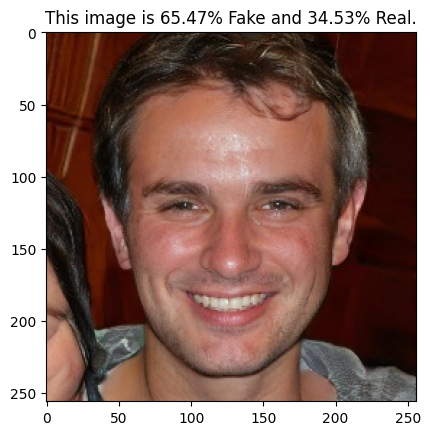

In [24]:
#real example
test_image = tf.keras.preprocessing.image.load_img('/kaggle/input/real_vs_fake/real-vs-fake/test/fake/008BYSE725.jpg', target_size=(256, 256, 3))
plt.imshow(test_image)


test_image_arr = tf.keras.preprocessing.image.img_to_array(test_image)
test_image_arr = np.expand_dims(test_image, axis=0)
test_image_arr = test_image_arr/255.


result = model.predict(test_image_arr)

plt.title(f"This image is {100 * (1 - result[0][0]):.2f}% Fake and {100 * result[0][0]:.2f}% Real.")

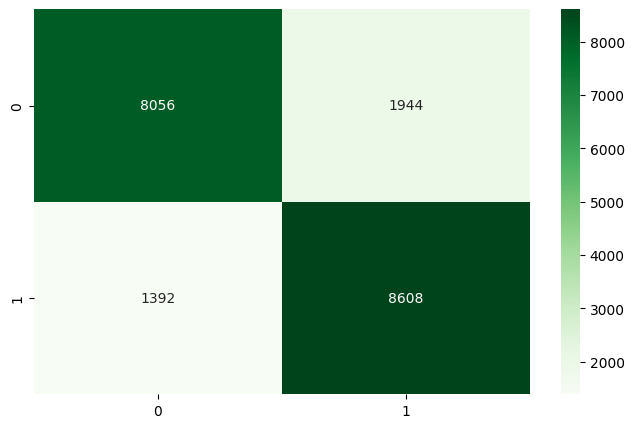

In [25]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import metrics
plt.figure(figsize = (8,5))
sns.heatmap(metrics.confusion_matrix(true_labels, predictions), annot = True,fmt="d",cmap = "Greens")
plt.show()